In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [485]:
import sys
sys.path.append('/Users/hamzaabdelhedi/Projects/enhancing_plt_utils/')
from enhancing_plt_utils import plt_enhancing
from color_maps import continuous_color_map, autumn, one_piece, oppenheimer, the_blues, green_bull, pink_ocean, pink_floyd, grey

In [3]:
path = "/Users/hamzaabdelhedi/Projects/data/MFRS_data/"
rdms_folder = os.path.join(path, "networks_rdms")
plots_folder = os.path.join(path, "plots")
subjects_dir = os.path.join(path, "subjects")
similarity_folder = os.path.join(path, "similarity_scores")

In [4]:
plt_enhancing(font_size=18, line_width=2.5, marker_size=10, marker_edge_width=2.5, line_width_global=2.5, patch_line_width=2.5, xtick_major_size=5.0, ytick_major_size=5.0, xtick_major_width=2.0, ytick_major_width=2.0, xtick_label_size="xx-large", ytick_label_size="xx-large", label_size="x-large", title_size="x-large", figure_title_size="xx-large", legend_size="large", figure_title_weight="bold", cap_size=4, dashed_pattern=[8.0, 4.0], savefig_format="svg", savefig_bbox="tight", spines_right=False, spines_top=False, auto_layout=True)

# Selecting Time Segment

In [88]:
ann_analysis_type = "with-meg_pretrained"
activation_type = "trained"
time_segment = 550
sampling_diff = 50

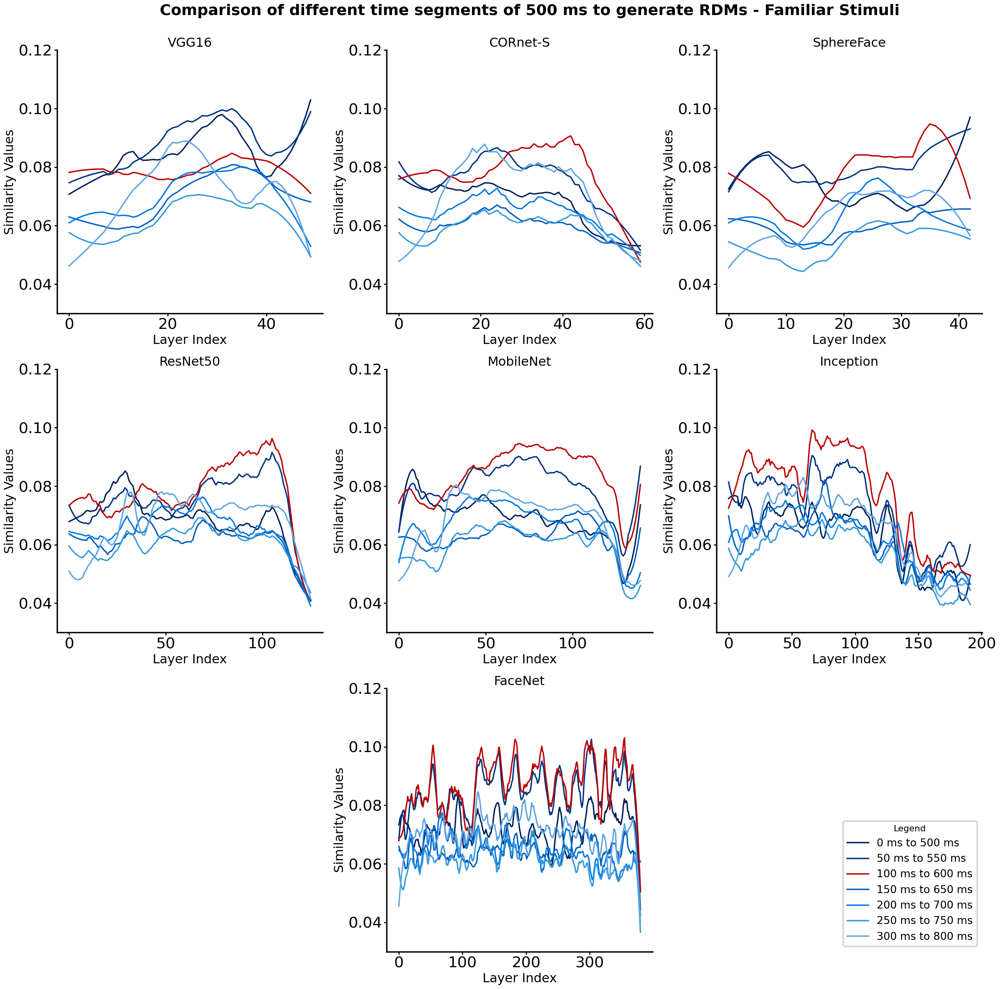

In [91]:
import os
import numpy as np
import scipy.signal
import matplotlib.pyplot as plt

models = ["vgg16_bn", "cornet_s", "SphereFace", "resnet50", "mobilenet", "inception_v3", "", "FaceNet"]
model_names = ["VGG16", "CORnet-S", "SphereFace", "ResNet50", "MobileNet", "Inception", "Untrained", "FaceNet"]

fig, axs = plt.subplots(3, 3, figsize=(30, 25))
axs = axs.flatten()

for idx, (model, ax) in enumerate(zip(models, axs)):
    if idx == 6:
        continue
    data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    for time_seg_index in range(data.shape[1]):
        max_values = np.max(data[:, time_seg_index, :, 0], axis=0)
        window_size = 15
        smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
        title = min(time_seg_index*50+int(time_segment)-sampling_diff, 800)
        if time_seg_index == 2:
            ax.plot(np.arange(0, len(max_values)), smoothed_values, label=f"{time_seg_index*50} ms to {title} ms", color=autumn[-time_seg_index])
        else:
            ax.plot(np.arange(0, len(max_values)), smoothed_values, label=f"{time_seg_index*50} ms to {title} ms", color=the_new_blues[time_seg_index])

    ax.set_ylim(0.03, 0.12)
    ax.set_title(model_names[idx])
    
    ax.set_xlabel("Layer Index")
    ax.set_ylabel("Similarity Values")

plt.suptitle(f"Comparison of different time segments of {int(time_segment) - sampling_diff} ms to generate RDMs - Familiar Stimuli", x=0.45, y=1)

handles, labels = axs[0].get_legend_handles_labels()
axs[8].add_artist(plt.legend(handles, labels, loc='lower right', title="Legend"))
axs[8].spines['right'].set_visible(False)
axs[8].spines['top'].set_visible(False)
axs[8].spines['left'].set_visible(False)
axs[8].spines['bottom'].set_visible(False)
axs[8].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)
fig.delaxes(axs[6])

plt.tight_layout(rect=[0, 0, 0.85, 1])  

plt.savefig(os.path.join(plots_folder, f'{int(time_segment)-sampling_diff}ms.png'), dpi=300)
plt.show()

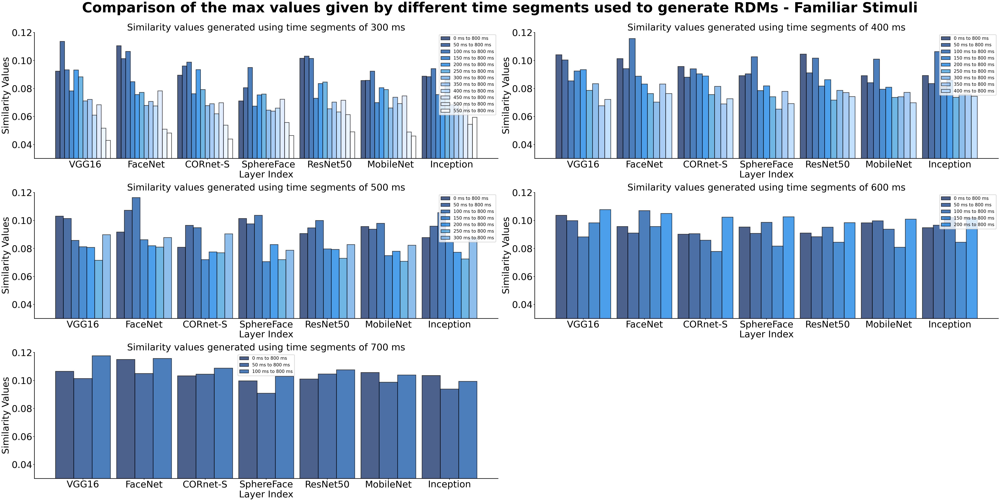

In [87]:
models = ["vgg16_bn", "FaceNet", "cornet_s", "SphereFace", "resnet50", "mobilenet", "inception_v3", ]
model_names = [ "VGG16", "FaceNet", "CORnet-S", "SphereFace", "ResNet50", "MobileNet", "Inception", ]
time_segments = [330, 440, 550, 660, 770]
diffs_sampling = [30, 40, 50, 60, 70]
fig, axs = plt.subplots(3, 2, figsize=(60, 30))
axs = axs.flatten()
for idx, (time_segment, ax) in enumerate(zip(time_segments, axs)):
    time_segment_sim_values = [[] for _ in range(7)]
    for model_idx, model in enumerate(models):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        for time_seg_index in range(data.shape[1]):
            max_value = np.max(data[:, time_seg_index, :, 0])
            time_segment_sim_values[model_idx].append(max_value)
    bar_width = 0.9/len(time_segment_sim_values[0]) # Width of each bar
    for n_values in range(len(time_segment_sim_values[0])):
        list_values = [model_sim_values[n_values] for model_sim_values in time_segment_sim_values]
        label = min(time_seg_index*50+int(time_segments[idx])-diffs_sampling[idx], 800)
        ax.bar(np.arange(len(models))+bar_width*n_values, list_values, width=bar_width, alpha=0.7, edgecolor='black', color=the_blues[n_values], label=f"{n_values*50} ms to {label} ms")
        ax.set_ylim(0.03, 0.12)
        ax.set_title(f'Similarity values generated using time segments of {time_segments[idx]-diffs_sampling[idx]} ms', fontsize=40)
        ax.set_xlabel("Layer Index", fontsize=40)
        ax.set_ylabel("Similarity Values", fontsize=40)
        ax.legend()
    x_ticks = [ bar_width*(len(time_segment_sim_values[0])//2) + idx_model for idx_model in np.arange(len(models)) ]
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(model_names)
    
    ax.tick_params(axis='both', which='major', labelsize=40)

# # Set main title
plt.suptitle(f"Comparison of the max values given by different time segments used to generate RDMs - Familiar Stimuli", x=0.5, y=1, fontsize=60)

# # Move legend outside the plot
axs[5].spines['right'].set_visible(False)
axs[5].spines['top'].set_visible(False)
axs[5].spines['left'].set_visible(False)
axs[5].spines['bottom'].set_visible(False)
axs[5].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)  # Remove tick marks and values

# # Adjust layout
plt.tight_layout()  

# # Save the plot
plt.savefig(os.path.join(plots_folder, f'time_segments_combined_max_per_model.png'), dpi=300, bbox_inches='tight')
plt.show()

# Continue using the 500 ms time segment from 100ms to 600ms

# Do we need to include the famous IDs in the training set?

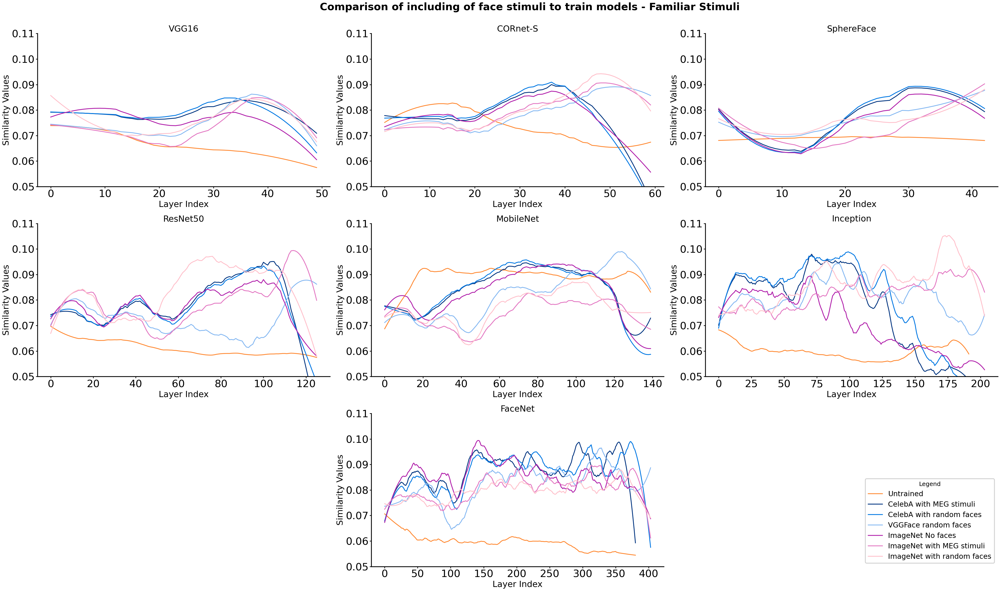

In [145]:
models = ["vgg16_bn", "cornet_s", "SphereFace", "resnet50", "mobilenet", "inception_v3", "", "FaceNet"]
model_names = ["VGG16", "CORnet-S", "SphereFace", "ResNet50", "MobileNet", "Inception", "Untrained", "FaceNet"]
labels = ["Untrained", "CelebA with MEG stimuli", "CelebA with random faces", "VGGFace random faces", "ImageNet No faces",
          "ImageNet with MEG stimuli", "ImageNet with random faces"]

time_segment = 550
sampling_diff = 50
ann_analysis_types = ["None", "with-meg_pretrained", "without-meg_pretrained", "None", "None", "meg_stimuli_faces", "random_faces"]
activations = ["untrained", "trained", "trained", "imagenet", "VGGFace", "imagenet", "imagenet"]
colors = [one_piece[3], pink_ocean[1], pink_ocean[4], pink_ocean[7], pink_ocean[-2], pink_ocean[-5], pink_ocean[-8]]
fig, axs = plt.subplots(3, 3, figsize=(50, 25))
axs = axs.flatten()

for idx, (model, ax) in enumerate(zip(models, axs)):
    if idx == 6:
        continue
    for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activations, colors, labels):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        if idx == 7:
            max_values = np.max(data[:, 2, :, 0], axis=0)
            window_size = 50
            smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
        else:
            max_values = np.max(data[:, 2, :, 0], axis=0)
            window_size = 25
            smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
        ax.plot(np.arange(0, len(max_values)), smoothed_values, label=label, color=color)

    ax.set_ylim(0.05, 0.11)
    ax.set_title(model_names[idx])
    
    ax.set_xlabel("Layer Index")
    ax.set_ylabel("Similarity Values")

plt.suptitle(f"Comparison of including of face stimuli to train models - Familiar Stimuli", x=0.45, y=1)

handles, labels = axs[0].get_legend_handles_labels()
axs[8].add_artist(plt.legend(handles, labels, loc='lower right', title="Legend"))
axs[8].spines['right'].set_visible(False)
axs[8].spines['top'].set_visible(False)
axs[8].spines['left'].set_visible(False)
axs[8].spines['bottom'].set_visible(False)
axs[8].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)
fig.delaxes(axs[6])

plt.tight_layout(rect=[0, 0, 0.85, 1])  

plt.savefig(os.path.join(plots_folder, f'influence_of_including_meg_stimuli_all_models.png'), dpi=300)
plt.show()

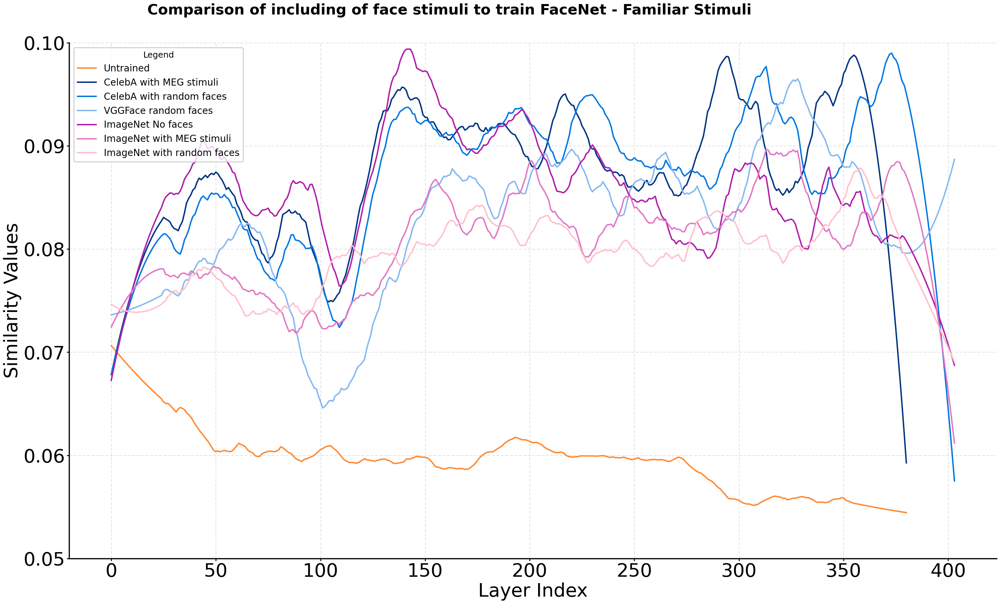

In [146]:

# Initialize the figure and subplots
fig, axs = plt.subplots(figsize=(30, 18))

for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activations, colors, labels):
    data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
    data = np.load(data_file)
    data[data[:, :, :, 1] > 0.05] = 0
    max_values = np.max(data[:, 2, :, 0], axis=0)
    window_size = 50
    smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
    axs.plot(np.arange(0, len(max_values)), smoothed_values, label=label, color=color, linewidth=3)

axs.set_ylim(0.05, 0.10)
plt.suptitle(f"Comparison of including of face stimuli to train FaceNet - Familiar Stimuli", x=0.45, y=1)
axs.legend(loc='upper left', title="Legend", fontsize=20)
axs.set_xlabel("Layer Index", fontsize=40)
axs.set_ylabel("Similarity Values", fontsize=40)
axs.grid(True, linestyle='--', alpha=0.7)
axs.tick_params(axis='both', which='major', labelsize=40)

# Save the plot
plt.savefig(os.path.join(plots_folder, f'influence_of_including_meg_stimuli_FaceNet.png'), dpi=300)
plt.show()


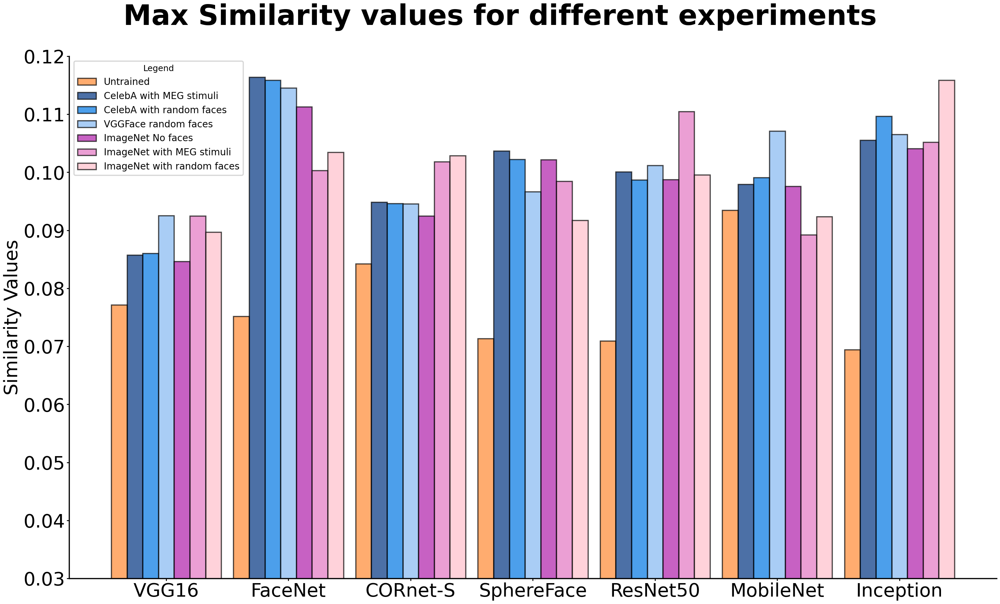

In [147]:
models = ["vgg16_bn", "FaceNet", "cornet_s", "SphereFace", "resnet50", "mobilenet", "inception_v3", ]
model_names = [ "VGG16", "FaceNet", "CORnet-S", "SphereFace", "ResNet50", "MobileNet", "Inception", ]
labels = ["Untrained", "CelebA with MEG stimuli", "CelebA with random faces", "VGGFace random faces", "ImageNet No faces", 
          "ImageNet with MEG stimuli", "ImageNet with random faces"]

time_segment = 550
sampling_diff = 50
ann_analysis_types = ["None", "with-meg_pretrained", "without-meg_pretrained", "None", "None", "meg_stimuli_faces", "random_faces"]
activations = ["untrained", "trained", "trained", "imagenet", "VGGFace", "imagenet", "imagenet"]
colors = [one_piece[3], pink_ocean[1], pink_ocean[4], pink_ocean[7], pink_ocean[-2], pink_ocean[-5], pink_ocean[-8]]

fig, ax = plt.subplots(figsize=(30, 18))
time_segment_sim_values = [[] for _ in range(7)]
for model_idx, model in enumerate(models):
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_fam_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_value = np.max(data[:, 2, :, 0])
        time_segment_sim_values[model_idx].append(max_value)
bar_width = 0.9/len(time_segment_sim_values[0]) # Width of each bar

for n_experiments in range(len(time_segment_sim_values[0])):
    list_values = [model_sim_values[n_experiments] for model_sim_values in time_segment_sim_values]
    ax.bar(np.arange(len(models))+bar_width*n_experiments, list_values, width=bar_width, alpha=0.7, edgecolor='black', color=colors[n_experiments], label=labels[n_experiments])
    ax.set_ylim(0.03, 0.12)
    ax.set_ylabel("Similarity Values", fontsize=40)
    ax.legend(loc='upper left', title="Legend", fontsize=20)
x_ticks = [ bar_width*(len(time_segment_sim_values[0])//2) + idx_model for idx_model in np.arange(len(models)) ]
ax.set_xticks(x_ticks)
ax.set_xticklabels(model_names)

ax.tick_params(axis='both', which='major', labelsize=40)

# # Set main title
plt.suptitle(f"Max Similarity values for different experiments", x=0.5, y=1, fontsize=60)

# # Adjust layout
plt.tight_layout()  

# # Save the plot
plt.savefig(os.path.join(plots_folder, f'Max_similarity_values_different_experiments.png'), dpi=300, bbox_inches='tight')
plt.show()

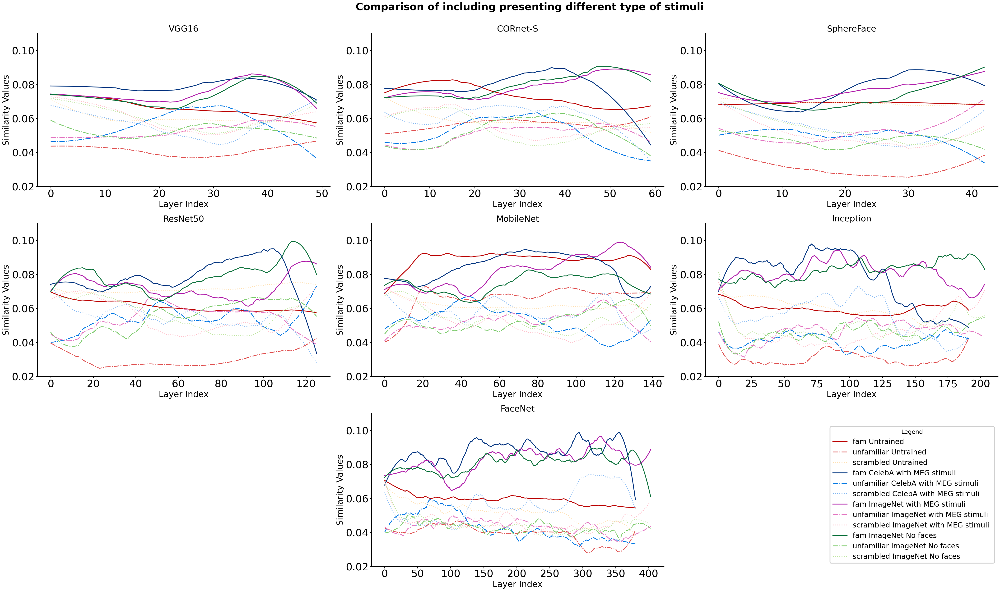

In [172]:
models = ["vgg16_bn", "cornet_s", "SphereFace", "resnet50", "mobilenet", "inception_v3", "", "FaceNet"]
model_names = ["VGG16", "CORnet-S", "SphereFace", "ResNet50", "MobileNet", "Inception", "Untrained", "FaceNet"]
labels = ["Untrained", "CelebA with MEG stimuli", "ImageNet with MEG stimuli", "ImageNet No faces"]

time_segment = 550
sampling_diff = 50
ann_analysis_types = ["None", "with-meg_pretrained", "None", "meg_stimuli_faces"]
activations = ["untrained", "trained", "imagenet", "imagenet"]
colors = [          [autumn[-2], autumn[-4], autumn[-7]],

          [the_blues[1], the_blues[4], the_blues[7]], 
          [oppenheimer[1], oppenheimer[4], oppenheimer[7]], 
          [green_bull[1], green_bull[4], green_bull[7]]]
fig, axs = plt.subplots(3, 3, figsize=(50, 25))
axs = axs.flatten()
line_styles = ['-', '-.', ':']
for idx, (model, ax) in enumerate(zip(models, axs)):
    if idx == 6:
        continue
    for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activations, colors, labels):
        for stimuli_index, stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
            data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
            data = np.load(data_file)
            data[data[:, :, :, 1] > 0.05] = 0
            if idx == 7:
                max_values = np.max(data[:, 2, :, 0], axis=0)
                window_size = 50
                smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
            else:
                max_values = np.max(data[:, 2, :, 0], axis=0)
                window_size = 25
                smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
            ax.plot(np.arange(0, len(max_values)), smoothed_values, label=f'{stimuli_type} {label} ', color=color[stimuli_index], linestyle = line_styles[stimuli_index])

    ax.set_ylim(0.02, 0.11)
    ax.set_title(model_names[idx])
    
    ax.set_xlabel("Layer Index")
    ax.set_ylabel("Similarity Values")

plt.suptitle(f"Comparison of including presenting different type of stimuli", x=0.45, y=1)

handles, labels = axs[0].get_legend_handles_labels()
axs[8].add_artist(plt.legend(handles, labels, loc='lower right', title="Legend"))
axs[8].spines['right'].set_visible(False)
axs[8].spines['top'].set_visible(False)
axs[8].spines['left'].set_visible(False)
axs[8].spines['bottom'].set_visible(False)
axs[8].tick_params(axis='both', which='both', length=0, labelbottom=False, labelleft=False)
fig.delaxes(axs[6])

plt.tight_layout(rect=[0, 0, 0.85, 1])  

plt.savefig(os.path.join(plots_folder, f'influence_of_presenting_different_type_of_stimuli_all_models.png'), dpi=300)
plt.show()

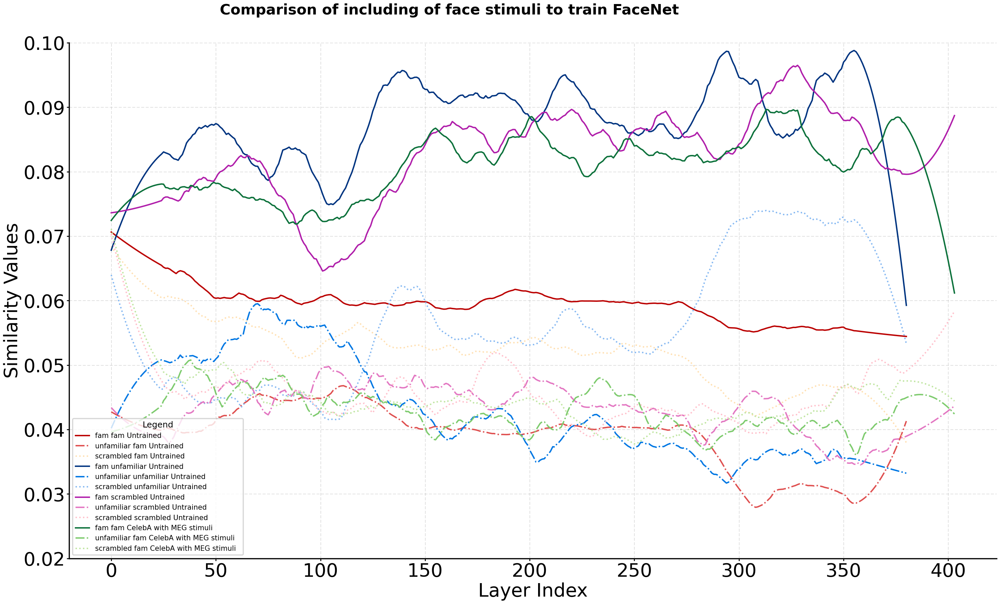

In [170]:

# Initialize the figure and subplots
fig, ax = plt.subplots(figsize=(30, 18))

for ann_analysis_type, activation_type, color, label in zip(ann_analysis_types, activations, colors, labels):
    for stimuli_index, stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=0)
        window_size = 50
        smoothed_values = scipy.signal.savgol_filter(max_values, window_size, 2)
        ax.plot(np.arange(0, len(max_values)), smoothed_values, label=f'{stimuli_type} {label} ', color=color[stimuli_index], linestyle = line_styles[stimuli_index], linewidth=3)

ax.set_ylim(0.02, 0.10)
plt.suptitle(f"Comparison of including of face stimuli to train FaceNet", x=0.45, y=1)
ax.legend(loc='lower left', title="Legend", fontsize=15)
ax.set_xlabel("Layer Index", fontsize=40)
ax.set_ylabel("Similarity Values", fontsize=40)
ax.grid(True, linestyle='--', alpha=0.7)
ax.tick_params(axis='both', which='major', labelsize=40)

# Save the plot
plt.savefig(os.path.join(plots_folder, f'influence_of_presenting_different_type_of_stimuli_FaceNet.png'), dpi=300)
plt.show()


# What about the regions

In [5]:
import mne
from matplotlib import colormaps
from mne.viz import Brain
cmap= colormaps["bwr"]
rois = mne.read_labels_from_annot(parc='aparc_sub', subject='fsaverage', subjects_dir=subjects_dir)

Reading labels from parcellation...
   read 226 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/lh.aparc_sub.annot
   read 224 labels from /Users/hamzaabdelhedi/Projects/data/MFRS_data/subjects/fsaverage/label/rh.aparc_sub.annot


In [6]:
cmap_2 = continuous_color_map("pink_ocean", vmin=-.1164, vmax=.1164)

In [344]:
# data_file = os.path.join(path, "avg_cornet_s_without-meg_pretrained_rdm_trained.npy")

# data = np.load(data_file)
model ="FaceNet"
activation_type = "trained"
ann_analysis_type = "with-meg_pretrained"
stimuli_type = "unfamiliar"
time_segment = 550
data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
data = np.load(data_file)
data[data[:, :, :, 1] > 0.05] = 0
values = np.max(data[:, 2, :, 0], axis=1)
max_values = np.max(data[:, 2, :, 0], axis=1)
min_values = np.min(data[:, 2, :, 0], axis=1)
extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
values = extreme_values
max_val = 0.12

In [345]:
brain = Brain(
        subject='fsaverage', subjects_dir=subjects_dir, surf="inflated", hemi="split",  background='white', size=(800, 400)
)
labels_lh = np.zeros(len(brain.geo["lh"].coords), dtype=int)
labels_rh = np.zeros(len(brain.geo["rh"].coords), dtype=int)
ctab_lh = list()
ctab_rh = list()
for i, (roi, value) in enumerate(zip(rois, values), 1):
    if roi.hemi == "lh":
        labels = labels_lh
        ctab = ctab_lh
    else:
        labels = labels_rh
        ctab = ctab_rh
    labels[roi.vertices] = i
    if roi.name in ["unknown-rh", "unknown-lh"]  or value == 0:
        ctab.append([128, 128, 128, 255, i])
    else:
        ctab.append([int(x * 255) for x in cmap_2.to_rgba(value)] + [i])

ctab_lh = np.array(ctab_lh)
ctab_rh = np.array(ctab_rh)

In [346]:
brain.add_annotation(
[(labels_lh, ctab_lh), (labels_rh, ctab_rh)], borders=False, alpha=1.0, remove_existing=True
)
brain.show_view() #caudal, ventral 
# Get screenshot and crop it
screenshot = brain.screenshot()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

In [347]:
# list_views = {}


In [348]:
list_views[f"{ann_analysis_type} {activation_type} {stimuli_type} lateral"] = cropped_screenshot

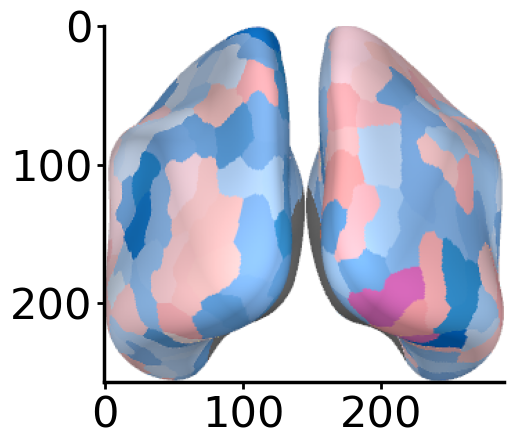

In [349]:
brain.add_annotation(
[(labels_lh, ctab_lh), (labels_rh, ctab_rh)], borders=False, alpha=1.0, remove_existing=True
)
brain.show_view("caudal") #caudal, ventral 
# Get screenshot and crop it
screenshot = brain.screenshot()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]
plt.imshow(cropped_screenshot)

In [350]:
list_views[f"{ann_analysis_type} {activation_type} {stimuli_type} caudal"] = cropped_screenshot

In [351]:
brain.add_annotation(
[(labels_lh, ctab_lh), (labels_rh, ctab_rh)], borders=False, alpha=1.0, remove_existing=True
)
brain.show_view("ventral") #caudal, ventral 
# Get screenshot and crop it
screenshot = brain.screenshot()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

In [352]:
list_views[f"{ann_analysis_type} {activation_type} {stimuli_type} ventral"] = cropped_screenshot

In [353]:
list(list_views.keys())

['with-meg_pretrained trained unfamiliar lateral',
 'with-meg_pretrained trained unfamiliar caudal',
 'with-meg_pretrained trained unfamiliar ventral',
 'with-meg_pretrained trained scrambled lateral',
 'with-meg_pretrained trained scrambled caudal',
 'with-meg_pretrained trained scrambled ventral',
 'with-meg_pretrained trained fam lateral',
 'with-meg_pretrained trained fam caudal',
 'with-meg_pretrained trained fam ventral',
 'None untrained fam lateral',
 'None untrained fam caudal',
 'None untrained fam ventral',
 'None untrained unfamiliar lateral',
 'None untrained unfamiliar caudal',
 'None untrained unfamiliar ventral',
 'None untrained scrambled lateral',
 'None untrained scrambled caudal',
 'None untrained scrambled ventral',
 'meg_stimuli_faces imagenet scrambled lateral',
 'meg_stimuli_faces imagenet scrambled caudal',
 'meg_stimuli_faces imagenet scrambled ventral',
 'meg_stimuli_faces imagenet unfamiliar lateral',
 'meg_stimuli_faces imagenet unfamiliar caudal',
 'meg_st

In [182]:
import pickle

# Save the list to a file
with open('list_views_16_12_23.pkl', 'wb') as f:
    pickle.dump(list_views, f)


/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_72841/2359224396.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


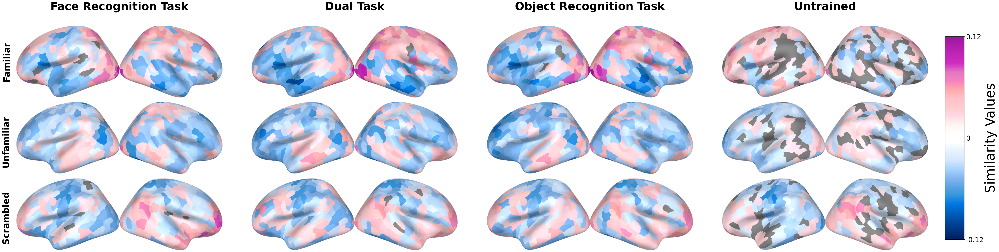

In [310]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(60, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " lateral"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 1].set_title('Dual Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 2].set_title('Object Recognition Task', fontsize=50, fontweight='bold', y=1.2)
axs[0, 3].set_title('Untrained', fontsize=50, fontweight='bold', y=1.2)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=40, fontweight='bold', rotation='vertical', y=0.1, x = -0.05)
axs[1, 0].set_title('Unfamiliar', fontsize=40, fontweight='bold', rotation='vertical', y=0.1, x = -0.05)
axs[2, 0].set_title('Scrambled', fontsize=40, fontweight='bold', rotation='vertical', y=0.1, x = -0.05)


cbar_ax = fig.add_axes([1, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-max_val, vmax=max_val)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.1164, 0, 0.1164])
cbar.set_ticklabels(['-0.12', '0', '0.12'])
cbar.set_label('Similarity Values', fontsize=60) 

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_lateral.png'), dpi=300)
plt.show()



/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_72841/2215677381.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


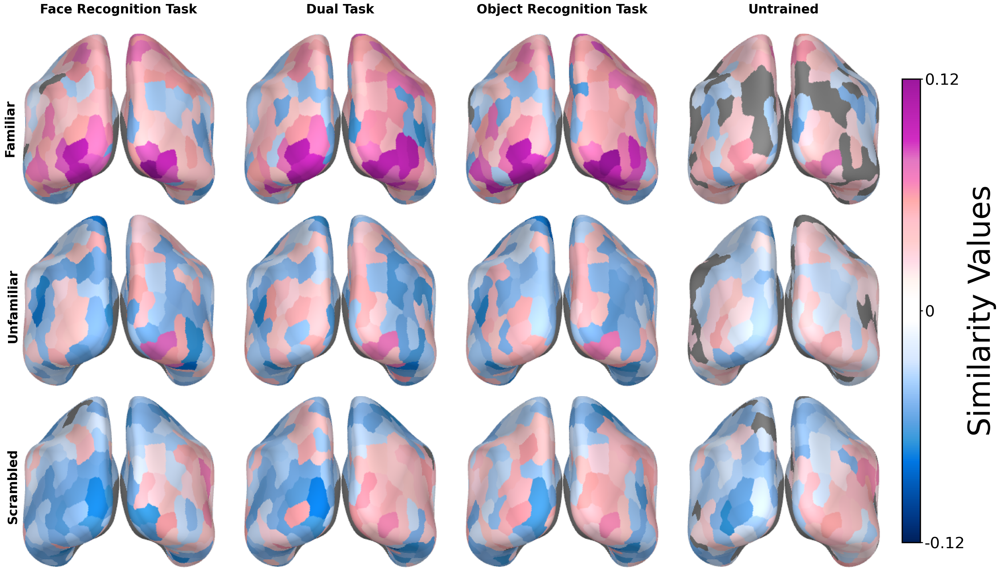

In [358]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(25, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " caudal"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=25, fontweight='bold', y=1.1)
axs[0, 1].set_title('Dual Task', fontsize=25, fontweight='bold', y=1.1)
axs[0, 2].set_title('Object Recognition Task', fontsize=25, fontweight='bold', y=1.1)
axs[0, 3].set_title('Untrained', fontsize=25, fontweight='bold', y=1.1)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=25, fontweight='bold', rotation='vertical', y=0.3, x = -0.05)
axs[1, 0].set_title('Unfamiliar', fontsize=25, fontweight='bold', rotation='vertical', y=0.25, x = -0.05)
axs[2, 0].set_title('Scrambled', fontsize=25, fontweight='bold', rotation='vertical', y=0.25, x = -0.05)


cbar_ax = fig.add_axes([1, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-max_val, vmax=max_val)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.1164, 0, 0.1164])
cbar.set_ticklabels(['-0.12', '0', '0.12'])
cbar.set_label('Similarity Values', fontsize=60) 

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_caudal.png'), dpi=300)
plt.show()



/var/folders/dy/yqsbvh6j7r7gz1ktnr8gx4g80000gn/T/ipykernel_72841/2002116778.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


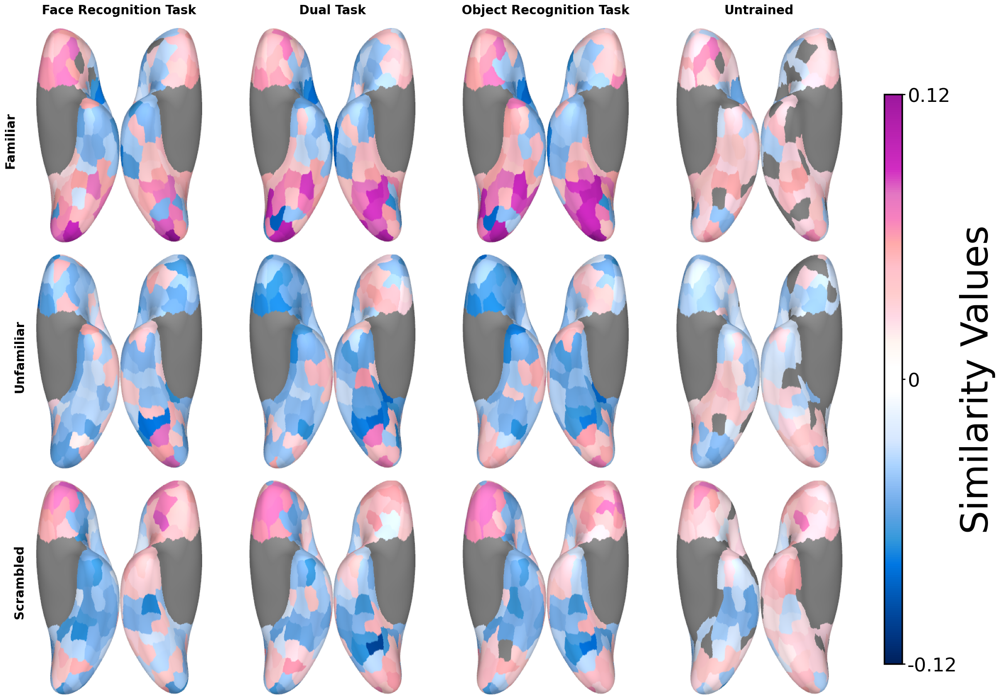

In [368]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(3, 4, figsize=(20, 16))
for i , stimuli_type in enumerate(["fam", "unfamiliar", "scrambled"]):
    for j, ann_analysis_type in enumerate(["with-meg_pretrained trained", "meg_stimuli_faces imagenet", "None imagenet",  "None untrained"]):
        axs[i, j].imshow(list_views[ann_analysis_type + " " + stimuli_type + " ventral"])
        axs[i, j].axis('off')


# # Add labels for each subplot
axs[0, 0].set_title('Face Recognition Task', fontsize=20, fontweight='bold', y=1.05)
axs[0, 1].set_title('Dual Task', fontsize=20, fontweight='bold', y=1.05)
axs[0, 2].set_title('Object Recognition Task', fontsize=20, fontweight='bold', y=1.05)
axs[0, 3].set_title('Untrained', fontsize=20, fontweight='bold', y=1.05)

ax2 = fig.add_axes([0.017, 0.665, 0.02, 0.2])
ax2.axis('off')
ax2.set_title('Familiar', fontsize=20, fontweight='bold', rotation='vertical', y=0.45, x = 0.1)
axs[1, 0].set_title('Unfamiliar', fontsize=20, fontweight='bold', rotation='vertical', y=0.35, x = -0.1)
axs[2, 0].set_title('Scrambled', fontsize=20, fontweight='bold', rotation='vertical', y=0.35, x = -0.1)


cbar_ax = fig.add_axes([1, 0.06, 0.02, 0.8])
norm = Normalize(vmin=-max_val, vmax=max_val)
cbar = plt.colorbar(cmap_2, cax=cbar_ax, ticks=[-0.1164, 0, 0.1164])
cbar.set_ticklabels(['-0.12', '0', '0.12'])
cbar.set_label('Similarity Values', fontsize=60) 

# Adjust layout and display the plot
plt.tight_layout()
plt.savefig(os.path.join(plots_folder, f'FaceNet_brain_maps_ventral.png'), dpi=300)
plt.show()



In [524]:
# Extract fusiform region data
fusiform_labels = [i for i, label in enumerate(rois) if "fusiform" in label.name.split('_')[0]]
region_name = [rois[i].name for i in fusiform_labels]


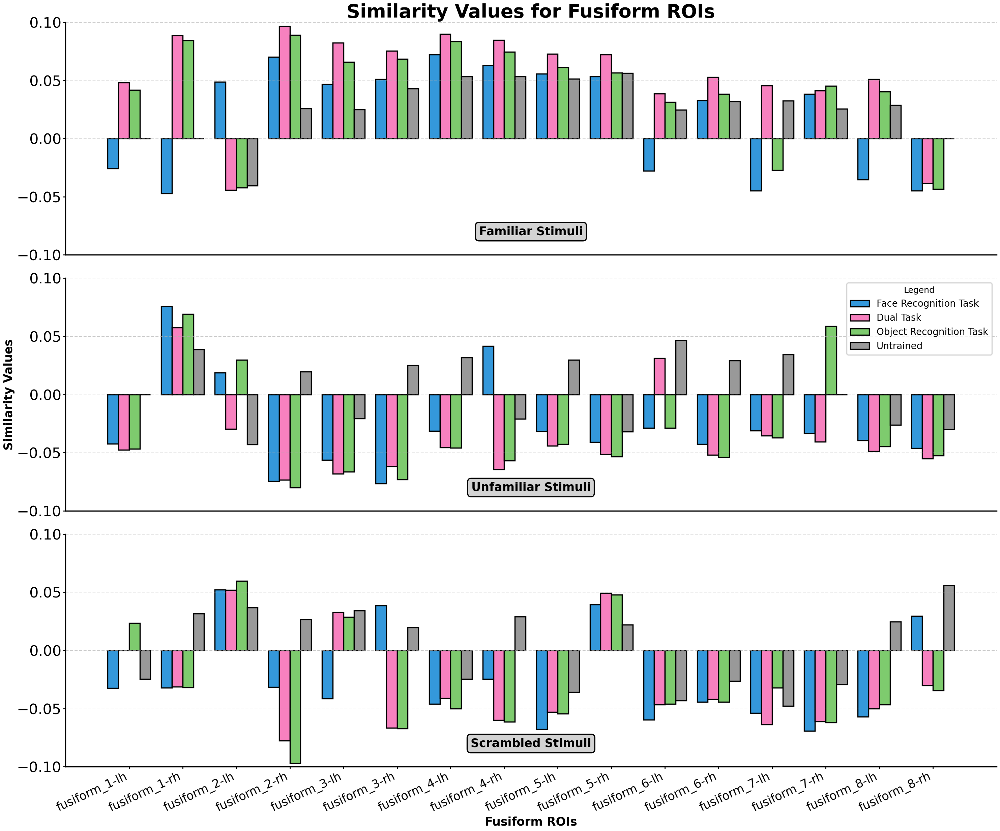

In [533]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[fusiform_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(fusiform_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Fusiform ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in fusiform_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Fusiform ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_fusiform_similarity_values.png'), dpi=300)
plt.show()

In [536]:
# Extract occipital region data
occipital_labels = [i for i, label in enumerate(rois) if "occipital" in label.name.split('_')[0]]
region_name = [rois[i].name for i in occipital_labels]

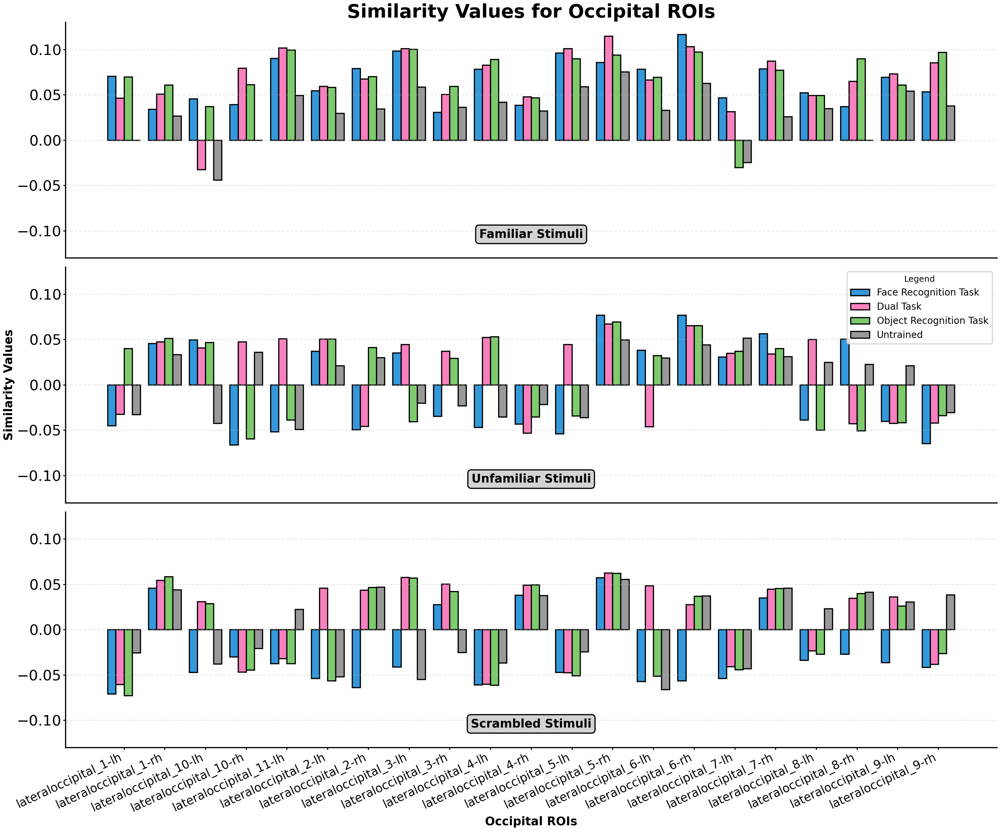

In [542]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[occipital_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.13, 0.13)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(occipital_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Occipital ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in occipital_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Occipital ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_occipital_similarity_values.png'), dpi=300)
plt.show()

In [559]:
# Extract IT region data
inferiortemporal_labels = [i for i, label in enumerate(rois) if "inferiortemporal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in inferiortemporal_labels]

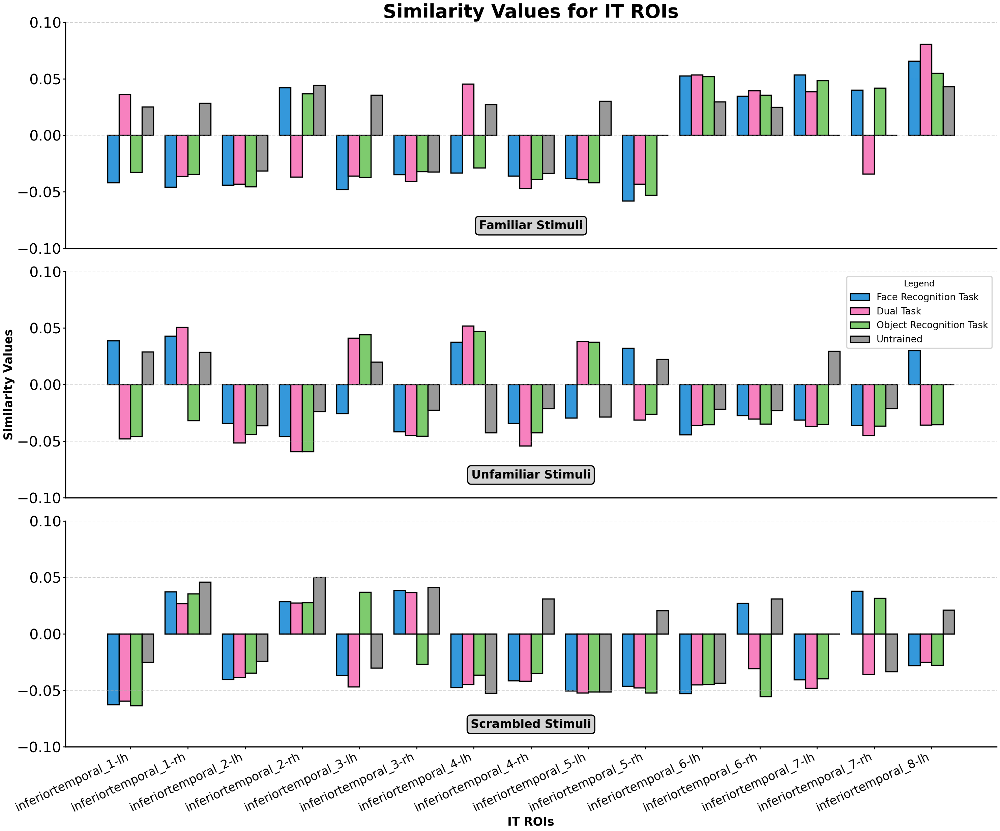

In [558]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[inferiortemporal_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(inferiortemporal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('IT ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in inferiortemporal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for IT ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_IT_similarity_values.png'), dpi=300)
plt.show()

In [562]:
# Extract IT region data
inferiorparietal_labels = [i for i, label in enumerate(rois) if "inferiorparietal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in inferiorparietal_labels]

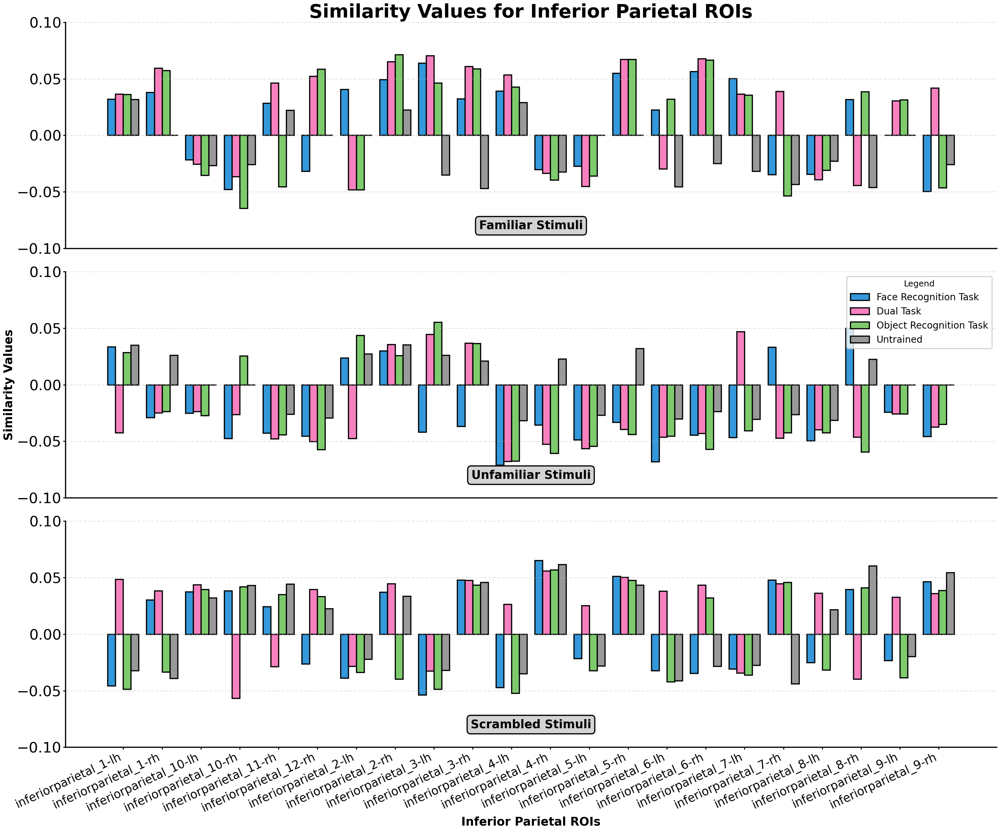

In [563]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[inferiorparietal_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(inferiorparietal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior Parietal ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in inferiorparietal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Inferior Parietal ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_Inferior_Parietal_similarity_values.png'), dpi=300)
plt.show()

In [565]:
# Extract IT region data
unique_labels = []
for i, label in enumerate(rois):
    unique_labels.append(label.name.split('_')[0])
print(np.unique(unique_labels))

['bankssts' 'caudalanteriorcingulate' 'caudalmiddlefrontal' 'cuneus'
 'entorhinal' 'frontalpole' 'fusiform' 'inferiorparietal'
 'inferiortemporal' 'insula' 'isthmuscingulate' 'lateraloccipital'
 'lateralorbitofrontal' 'lingual' 'medialorbitofrontal' 'middletemporal'
 'paracentral' 'parahippocampal' 'parsopercularis' 'parsorbitalis'
 'parstriangularis' 'pericalcarine' 'postcentral' 'posteriorcingulate'
 'precentral' 'precuneus' 'rostralanteriorcingulate'
 'rostralmiddlefrontal' 'superiorfrontal' 'superiorparietal'
 'superiortemporal' 'supramarginal' 'temporalpole' 'transversetemporal'
 'unknown-lh' 'unknown-rh']


In [566]:
# Extract IT region data
bankssts_labels = [i for i, label in enumerate(rois) if "bankssts" in label.name.split('_')[0]]
region_name = [rois[i].name for i in bankssts_labels]

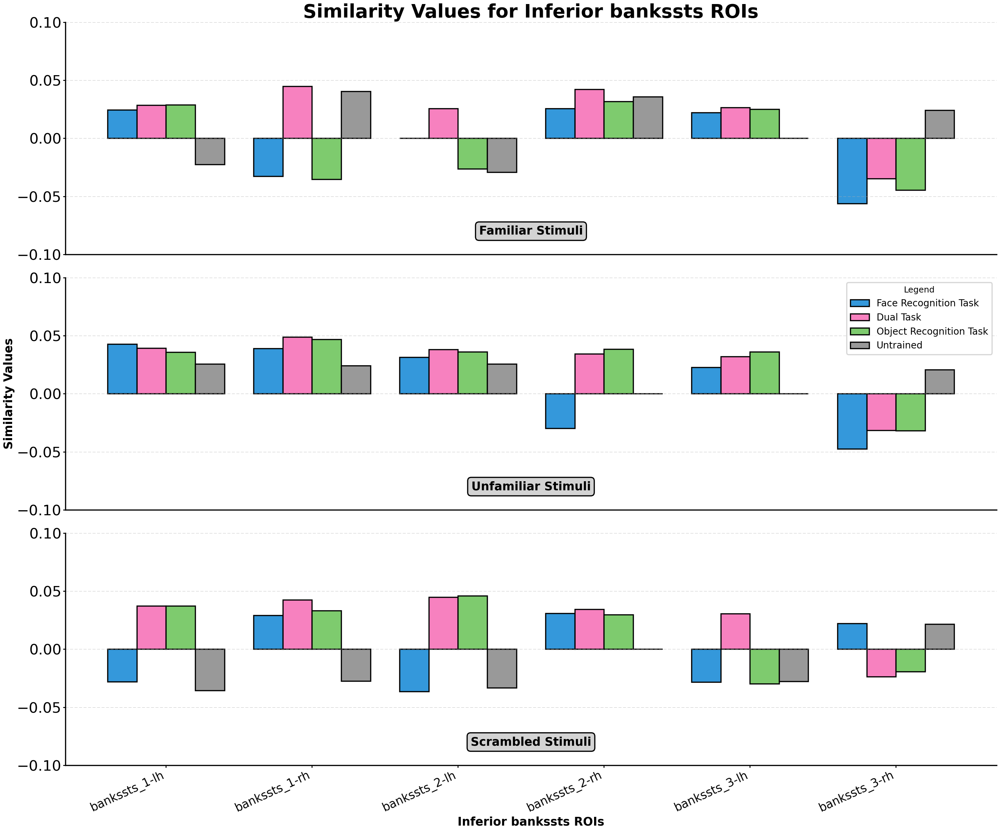

In [567]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[bankssts_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(bankssts_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior bankssts ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in bankssts_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for Inferior bankssts ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_Inferior_bankssts_similarity_values.png'), dpi=300)
plt.show()

In [568]:
# Extract IT region data
middletemporal_labels = [i for i, label in enumerate(rois) if "middletemporal" in label.name.split('_')[0]]
region_name = [rois[i].name for i in middletemporal_labels]

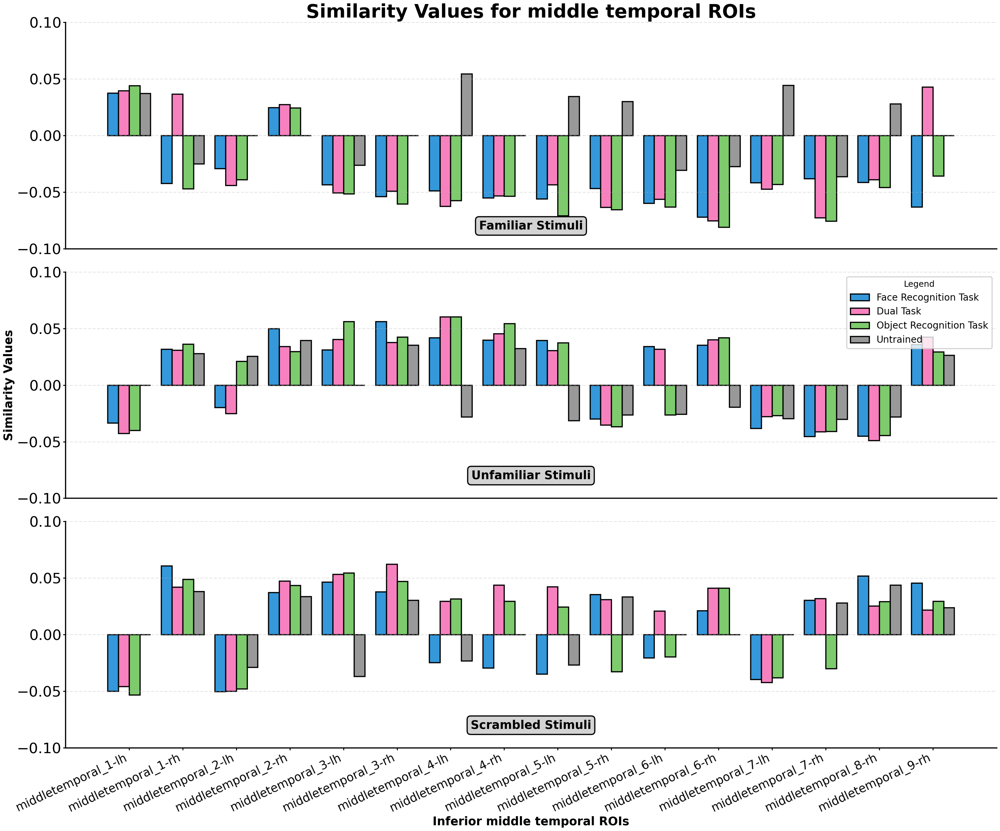

In [570]:
model = "FaceNet"
labels = [ "Face Recognition Task", "Dual Task", "Object Recognition Task",  "Untrained",]
ann_analysis_types = ["with-meg_pretrained",  "None", "meg_stimuli_faces", "None", ]
activations = ["trained", "imagenet", "imagenet", "untrained",]
stimuli_types = ["fam", "unfamiliar", "scrambled"]

time_segment = 550
sampling_diff = 50
colors = [the_blues[5], oppenheimer[5], green_bull[4], grey[2]]
# colors = [one_piece[0], one_piece[2], one_piece[12], one_piece[-1]]
fig, ax = plt.subplots(3, 1, figsize=(30, 25))
axs = ax.flatten()
for stimuli_idx, stimuli_type in enumerate(stimuli_types):
    sim_values = []
    for ann_analysis_type, activation_type in zip(ann_analysis_types, activations):
        data_file = os.path.join(similarity_folder, f"avg_{model}_{ann_analysis_type}_meg_rdm_{activation_type}_{stimuli_type}_{time_segment}_50.npy")
        data = np.load(data_file)
        data[data[:, :, :, 1] > 0.05] = 0
        max_values = np.max(data[:, 2, :, 0], axis=1)
        min_values = np.min(data[:, 2, :, 0], axis=1)
        extreme_values = np.where(np.abs(min_values) > max_values, min_values, max_values)
        values = extreme_values
        sim_values.append(values[middletemporal_labels])
    bar_width = 0.8/len(sim_values)
    for idx_analysis in range(len(ann_analysis_types)):
        analysis_sim_values = sim_values[idx_analysis]
        axs[stimuli_idx].bar(np.arange(len(analysis_sim_values))+bar_width*idx_analysis, analysis_sim_values, width=bar_width, edgecolor='black', color=colors[idx_analysis], label=labels[idx_analysis])
    axs[stimuli_idx].set_ylim(-0.10, 0.10)
    if stimuli_idx == 1:
        axs[stimuli_idx].set_ylabel("Similarity Values", fontsize=25, fontweight='bold')
        axs[stimuli_idx].legend(loc='upper right', title="Legend", fontsize=20)
    axs[stimuli_idx].set_xticks(np.arange(len(middletemporal_labels)) + 1.5 * bar_width)  # Adjust the X ticks to be in the middle of grouped bars
    if stimuli_idx == 2:
        axs[stimuli_idx].set_xlabel('Inferior middle temporal ROIs', fontsize=25, fontweight='bold')
        axs[stimuli_idx].set_xticklabels([rois[i].name for i in middletemporal_labels], fontsize=25, rotation=25, ha="right")
    else:
        axs[stimuli_idx].set_xticklabels([])
        axs[stimuli_idx].tick_params(axis='x', which='both', length=0)
        # axs[stimuli_idx].spines['bottom'].set_visible(False)
    if stimuli_idx == 0:
        axs[stimuli_idx].set_title(f'Similarity Values for middle temporal ROIs', fontsize=40, loc='center', pad=10, fontweight='bold')
    axs[stimuli_idx].grid(axis="y", linestyle='--', alpha=0.7)
for idx, label in enumerate(['Familiar Stimuli', 'Unfamiliar Stimuli', 'Scrambled Stimuli']):
    bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgrey")
    axs[idx].text(0.5, 0.1, label, fontsize=25, fontweight='bold', ha="center", va="center", transform=axs[idx].transAxes, bbox=bbox_props)



# # # Adjust layout
plt.tight_layout()  
plt.savefig(os.path.join(plots_folder, f'FaceNet_middletemporal_similarity_values.png'), dpi=300)
plt.show()

In [573]:
# END